<a href="https://colab.research.google.com/github/hannah-jp/capstone820/blob/main/Final_Results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 50.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 34.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=70a6ce8654de682c88dbf331bca15aa6413e4f1495d60e8c21945a62d945518f
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [3]:
from google.colab import files
uploaded = files.upload()

Saving SDSS_18_120K.csv to SDSS_18_120K.csv


In [39]:
import pandas as pd
# from scipy.io import arff
import numpy as np
import io

df = pd.read_csv(io.StringIO(uploaded['SDSS_18_120K.csv'].decode('utf-8')))


df.sample(5)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
101483,1.237660e+18,240.916046,43.144813,18.65456,17.39017,16.99541,16.74461,16.60951,3226,301,2,61,1.317400e+18,GALAXY,0.049500,1170,52756,371
15722,1.237660e+18,157.258873,38.956756,18.93399,17.54118,16.95527,16.72531,16.57365,3647,301,3,125,3.672850e+18,STAR,0.000576,3262,54884,612
7974,1.237660e+18,238.901388,35.184135,18.27864,16.42531,15.55077,15.17411,14.86978,3958,301,4,62,1.595450e+18,GALAXY,0.085858,1417,53141,176
110134,1.237680e+18,338.886614,0.998675,18.33700,17.40522,17.09772,16.97766,16.90546,7717,301,1,188,1.167660e+18,STAR,-0.000295,1037,52878,362
107325,1.237650e+18,144.070246,-0.063055,19.44464,19.48445,19.22947,19.18990,19.26172,756,301,3,189,5.359760e+17,QSO,1.141481,476,52314,175


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120000 entries, 0 to 119999
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   objid      120000 non-null  float64
 1   ra         120000 non-null  float64
 2   dec        120000 non-null  float64
 3   u          120000 non-null  float64
 4   g          120000 non-null  float64
 5   r          120000 non-null  float64
 6   i          120000 non-null  float64
 7   z          120000 non-null  float64
 8   run        120000 non-null  int64  
 9   rerun      120000 non-null  int64  
 10  camcol     120000 non-null  int64  
 11  field      120000 non-null  int64  
 12  specobjid  120000 non-null  float64
 13  class      120000 non-null  object 
 14  redshift   120000 non-null  float64
 15  plate      120000 non-null  int64  
 16  mjd        120000 non-null  int64  
 17  fiberid    120000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usage: 16.5+ MB


In [6]:
df.isnull().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

There are no null values in this dataset.

In [7]:
df.size

2160000

In [8]:
df['class'].head(10)

0      STAR
1    GALAXY
2    GALAXY
3       QSO
4      STAR
5       QSO
6      STAR
7    GALAXY
8    GALAXY
9      STAR
Name: class, dtype: object

In [9]:
df['class'] = df['class'].replace('GALAXY','0')
df['class'] = df['class'].replace('STAR', '1')
df['class'] = df['class'].replace('QSO', '2')
df['class'].head(10)

0    1
1    0
2    0
3    2
4    1
5    2
6    1
7    0
8    0
9    1
Name: class, dtype: object

In [10]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['class'] = le.fit_transform(df['class'])

In [11]:
df.describe()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
count,1.200000e+05,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.0,120000.000000,120000.000000,1.200000e+05,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000
mean,1.237663e+18,177.162782,24.760234,18.636976,17.405781,16.879918,16.623845,16.466030,3976.896833,301.0,3.309492,186.239408,2.916027e+18,0.593250,0.169952,2589.868525,53913.184217,342.707142
std,7.883050e+12,78.091616,20.481615,0.831607,0.984321,1.131498,1.206538,1.281903,1693.526624,0.0,1.617244,140.825137,2.496865e+18,0.672489,0.436013,2217.646838,1549.888972,216.738692
min,1.237650e+18,0.011306,-19.495456,10.611810,9.300097,8.814259,8.667918,8.947795,109.000000,301.0,1.000000,11.000000,2.994900e+17,0.000000,-0.004268,266.000000,51608.000000,1.000000
25%,1.237660e+18,136.052165,6.621935,18.211953,16.851275,16.195715,15.864358,15.619798,2826.000000,301.0,2.000000,84.000000,1.334220e+18,0.000000,0.000002,1185.000000,52731.000000,162.000000
50%,1.237660e+18,180.056457,23.503742,18.872550,17.514040,16.889755,16.598590,16.426485,3900.000000,301.0,3.000000,152.000000,2.347515e+18,0.000000,0.045771,2085.000000,53726.000000,329.000000
75%,1.237670e+18,224.210010,40.059257,19.271068,18.053463,17.582660,17.342098,17.230750,5061.000000,301.0,5.000000,248.000000,3.275320e+18,1.000000,0.095350,2909.000000,54585.000000,503.000000
max,1.237680e+18,359.999615,84.490494,19.599990,19.996050,31.990100,32.141470,30.017040,8162.000000,301.0,6.000000,982.000000,1.412690e+19,2.000000,7.011245,12547.000000,58932.000000,1000.000000


In [12]:
df.corr()['class'].sort_values(ascending=False)

class        1.000000
redshift     0.542397
z            0.501366
i            0.464578
r            0.402624
mjd          0.400256
plate        0.393985
specobjid    0.393985
g            0.279090
fiberid      0.107708
run          0.095119
objid        0.079602
dec          0.016582
camcol       0.012308
field       -0.038752
ra          -0.048832
u           -0.053905
rerun             NaN
Name: class, dtype: float64

In [36]:
df.corr()

,ra,dec,u,g,r,i,z,class,redshift,plate
ra,1.000000,0.084750,0.018077,0.016197,0.011776,0.006233,0.000876,-0.048832,-0.003237,-0.060793
dec,0.084750,1.000000,-0.025857,-0.009976,-0.000898,0.002684,0.008342,0.016582,0.013734,0.017486
u,0.018077,-0.025857,1.000000,0.842956,0.692640,0.616567,0.560570,-0.053905,0.173008,0.007413
g,0.016197,-0.009976,0.842956,1.000000,0.956416,0.915445,0.885299,0.279090,0.423595,0.147211
r,0.011776,-0.000898,0.692640,0.956416,1.000000,0.976324,0.960178,0.402624,0.454529,0.202948
i,0.006233,0.002684,0.616567,0.915445,0.976324,1.000000,0.976609,0.464578,0.450811,0.235566
z,0.000876,0.008342,0.560570,0.885299,0.960178,0.976609,1.000000,0.501366,0.441197,0.251717
class,-0.048832,0.016582,-0.053905,0.279090,0.402624,0.464578,0.501366,1.000000,0.542397,0.393985
redshift,-0.003237,0.013734,0.173008,0.423595,0.454529,0.450811,0.441197,0.542397,1.000000,0.174835
plate,-0.060793,0.017486,0.007413,0.147211,0.202948,0.235566,0.251717,0.393985,0.174835,1.000000


<Axes: >

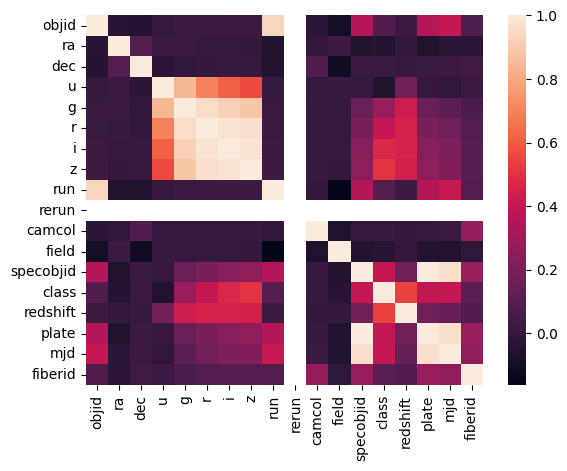

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure()
sns.heatmap(df.corr(),cbar=True)

In [37]:
df.head(5)

,ra,dec,u,g,r,i,z,class,redshift,plate
0,173.039087,-2.521477,17.96934,17.10763,16.76155,16.62646,16.60012,1,0.000546,326
1,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,0,0.116123,6121
2,343.289694,20.995655,19.53350,17.72243,16.61534,16.04093,15.59381,0,0.096418,6120
3,29.984165,10.843764,19.15626,17.81380,16.79765,16.27480,15.88608,2,0.140317,4656
4,266.621865,26.717041,18.74441,17.24021,16.67171,16.48060,16.37055,1,-0.000124,2183


The filter 'u' is correlated with all the filters. Redshift also seems to have a good correlation with the ugriz filters. Other notable correlations are between objid and spaceid, plate, mjd, and run.

In [ ]:
# sns.pairplot(df, diag_kind = "kde")
# plt.show()

In [14]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)

<ipython-input-14-ce1e41813c97>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [15]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

One important information from the profiliing report above is that redshift is highly correlated with class.

In [16]:
df['class'].value_counts()

0    61466
1    45878
2    12656
Name: class, dtype: int64

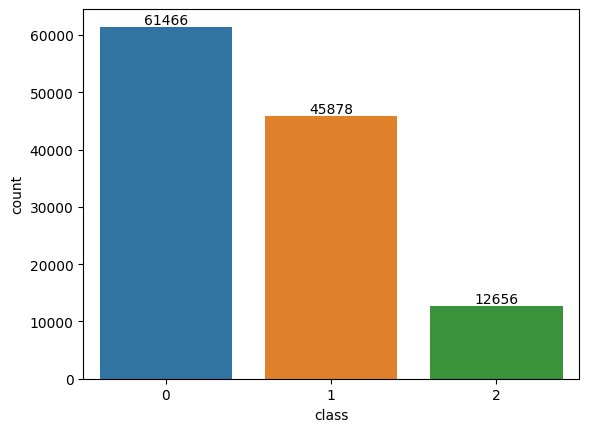

In [17]:
graph=sns.countplot(x=df["class"]);
graph.bar_label(graph.containers[0]);

array([[<Axes: title={'center': 'objid'}>,
        <Axes: title={'center': 'ra'}>, <Axes: title={'center': 'dec'}>,
        <Axes: title={'center': 'u'}>],
       [<Axes: title={'center': 'g'}>, <Axes: title={'center': 'r'}>,
        <Axes: title={'center': 'i'}>, <Axes: title={'center': 'z'}>],
       [<Axes: title={'center': 'run'}>,
        <Axes: title={'center': 'rerun'}>,
        <Axes: title={'center': 'camcol'}>,
        <Axes: title={'center': 'field'}>],
       [<Axes: title={'center': 'specobjid'}>,
        <Axes: title={'center': 'class'}>,
        <Axes: title={'center': 'redshift'}>,
        <Axes: title={'center': 'plate'}>],
       [<Axes: title={'center': 'mjd'}>,
        <Axes: title={'center': 'fiberid'}>, <Axes: >, <Axes: >]],
      dtype=object)

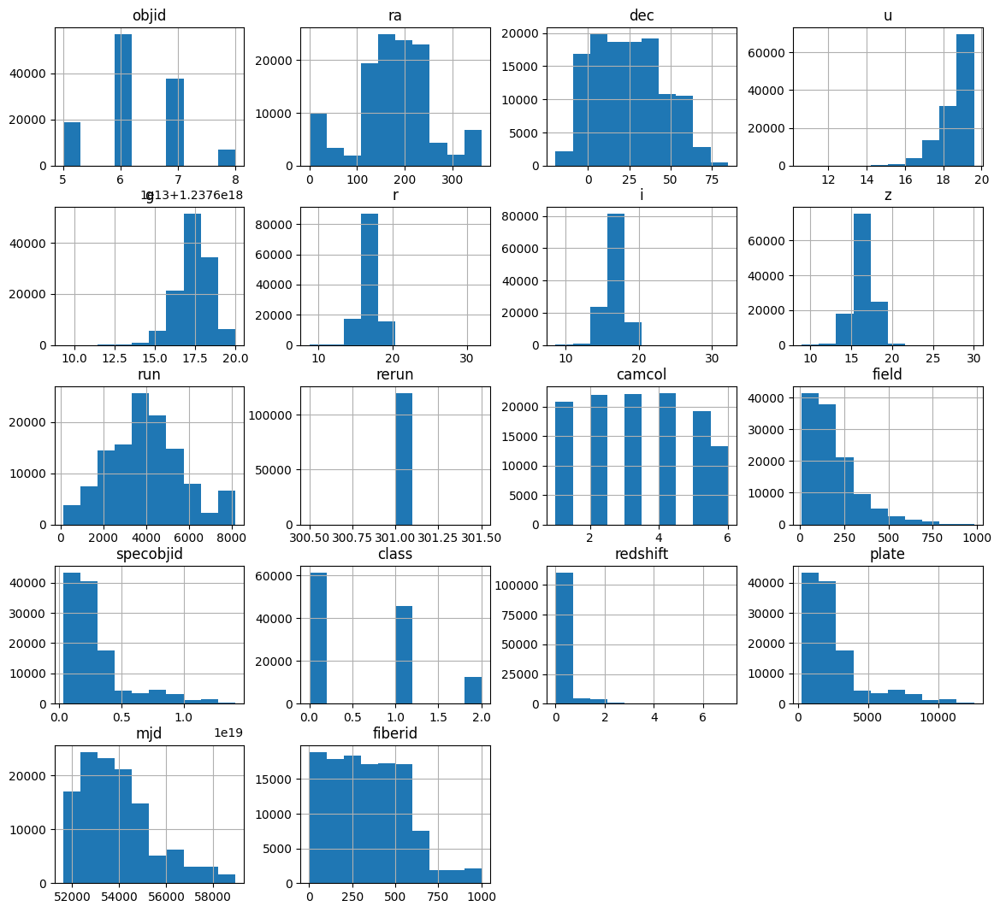

In [18]:
df.hist(figsize=[14,13])

In [19]:
df.skew()

objid        0.171117
ra          -0.147397
dec          0.277144
u           -1.394562
g           -0.730261
r           -0.139809
i            0.048728
z            0.159915
run          0.285860
rerun        0.000000
camcol       0.104264
field        1.500489
specobjid    1.845186
class        0.698370
redshift     4.029148
plate        1.845186
mjd          0.934754
fiberid      0.467490
dtype: float64

-----------------------------------------------Feature Selection----------------------------------------------------------

**The feature objid is a unique SDSS identifier that is composed of run, rerun, camcol, and field. These features give info regarding the field that the image was captured in. The features plate, mjd, and fiberid serve as an identification of any SDSS spectrum. The mentioned features above do not give necessary information that can help with the classification and therefore, can be excluded.**

In [20]:
df = df.drop(columns=['objid', 'run', 'rerun', 'camcol', 'field', 'specobjid', 'mjd', 'fiberid'])
df.head()

,ra,dec,u,g,r,i,z,class,redshift,plate
0,173.039087,-2.521477,17.96934,17.10763,16.76155,16.62646,16.60012,1,0.000546,326
1,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,0,0.116123,6121
2,343.289694,20.995655,19.53350,17.72243,16.61534,16.04093,15.59381,0,0.096418,6120
3,29.984165,10.843764,19.15626,17.81380,16.79765,16.27480,15.88608,2,0.140317,4656
4,266.621865,26.717041,18.74441,17.24021,16.67171,16.48060,16.37055,1,-0.000124,2183


<Axes: >

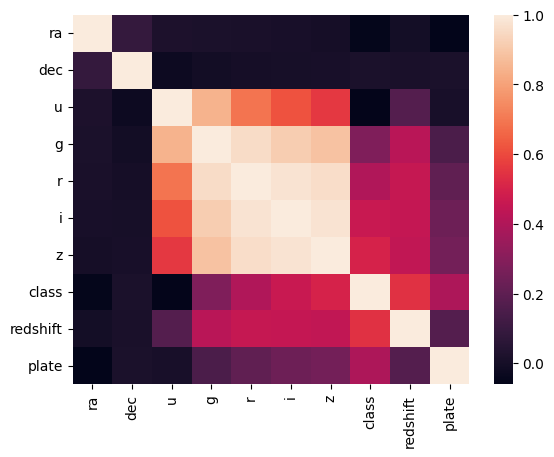

In [21]:
plt.figure()
sns.heatmap(df.corr(),cbar=True)

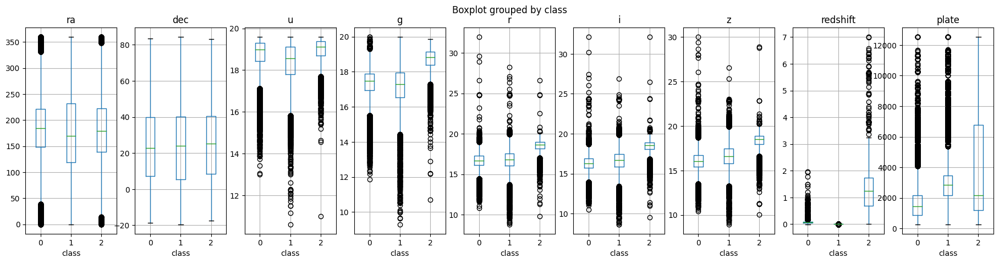

In [22]:
selctd_features=["ra", "dec", "u", "g", "r", "i", "z", "redshift", "plate"]

import matplotlib.pyplot as plt
fig, PlotCanvas=plt.subplots(nrows=1, ncols=len(selctd_features), figsize=(22,5))

# Creating box plots for each continuous predictor against the Target Variable "class"
for PredictorCol , i in zip(selctd_features, range(len(selctd_features))):
    df.boxplot(column=PredictorCol, by='class', figsize=(5,5), vert=True, ax=PlotCanvas[i])

---------------------------------------------------Models-----------------------------------------------------------------

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from numpy import mean
from numpy import absolute
from numpy import sqrt

from sklearn import preprocessing
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

TRAIN-TEST SPLIT

In [45]:
class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

print ('Before SMOTE')
print(y_train.value_counts())

sm = SMOTE()
X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)

print ('\nAfter SMOTE')
print(y_train_oversampled.value_counts())



Before SMOTE
GALAXY    49173
STAR      36702
QSO       10125
Name: class, dtype: int64

After SMOTE
GALAXY    49173
STAR      49173
QSO       49173
Name: class, dtype: int64


SMOTE method was used to handle the imbalance in the dataset. The method was applied after the train-test split so that the test data remained unaffected.

In [52]:
rf = RandomForestClassifier(max_depth=5, random_state=1)
rf.fit(X_train_oversampled, y_train_oversampled)
print('Training set metrics:')
print('Accuracy: ',	rf.score(X_train_oversampled, y_train_oversampled))
print('Precision Score: ', precision_score(y_train_oversampled, rf.predict(X_train_oversampled), average=None))
print('Recall Score: ', recall_score(y_train_oversampled, rf.predict(X_train_oversampled), average=None))
print('F1 Score: ', f1_score(y_train_oversampled, rf.predict(X_train_oversampled), average=None))
print('-----------------------------------------------------------------------------')
y_pred = rf.predict(X_test)
print ('\nTest set metrics: \n', classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion matrix')
print(cnf_matrix)
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)
FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)
print('FP:', FP, 'FN:', FN,'TP:', TP,'TN:', TN)

Training set metrics:
Accuracy:  0.9756641517363865
Precision Score:  [0.94566386 0.99237033 0.99086049]
Recall Score:  [0.98393427 0.9442987  0.99875948]
F1 Score:  [0.96441955 0.9677379  0.9947943 ]
-----------------------------------------------------------------------------

Test set metrics: 
               precision    recall  f1-score   support

      GALAXY       0.98      0.98      0.98     12293
         QSO       0.96      0.93      0.94      2531
        STAR       0.99      1.00      0.99      9176

    accuracy                           0.98     24000
   macro avg       0.98      0.97      0.97     24000
weighted avg       0.98      0.98      0.98     24000


Confusion matrix
[[12100    99    94]
 [  179  2352     0]
 [   13     0  9163]]
FP: [192.  99.  94.] FN: [193. 179.  13.] TP: [12100.  2352.  9163.] TN: [11515. 21370. 14730.]


In [58]:
gbc = GradientBoostingClassifier(n_estimators=25, learning_rate=0.7, max_depth=5, random_state=1)
gbc.fit(X_train_oversampled, y_train_oversampled)
print('Training set metrics:')
print('Accuracy: ',	gbc.score(X_train_oversampled, y_train_oversampled))
print('Precision Score: ', precision_score(y_train_oversampled, gbc.predict(X_train_oversampled), average=None))
print('Recall Score: ', recall_score(y_train_oversampled, gbc.predict(X_train_oversampled), average=None))
print('F1 Score: ', f1_score(y_train_oversampled, gbc.predict(X_train_oversampled), average=None))
print('-----------------------------------------------------------------------------')
y_pred = gbc.predict(X_test)
print ('\nTest set metrics: \n', classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion matrix')
print(cnf_matrix)
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)
FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)
print('FP:', FP, 'FN:', FN,'TP:', TP,'TN:', TN)

Training set metrics:
Accuracy:  0.9943668273239379
Precision Score:  [0.98812577 0.99535065 0.99967464]
Recall Score:  [0.9950786  0.98828625 0.99973563]
F1 Score:  [0.99159    0.99180587 0.99970513]
-----------------------------------------------------------------------------

Test set metrics: 
               precision    recall  f1-score   support

      GALAXY       0.99      0.99      0.99     12293
         QSO       0.95      0.96      0.96      2531
        STAR       1.00      1.00      1.00      9176

    accuracy                           0.99     24000
   macro avg       0.98      0.98      0.98     24000
weighted avg       0.99      0.99      0.99     24000


Confusion matrix
[[12157   121    15]
 [   91  2440     0]
 [   18     2  9156]]
FP: [109. 123.  15.] FN: [136.  91.  20.] TP: [12157.  2440.  9156.] TN: [11598. 21346. 14809.]


In [59]:
gb = GaussianNB()
gb.fit(X_train_oversampled, y_train_oversampled)
print('Training set metrics:')
print('Accuracy: ',	gb.score(X_train_oversampled, y_train_oversampled))
print('Precision Score: ', precision_score(y_train_oversampled, gb.predict(X_train_oversampled), average=None))
print('Recall Score: ', recall_score(y_train_oversampled, gb.predict(X_train_oversampled), average=None))
print('F1 Score: ', f1_score(y_train_oversampled, gb.predict(X_train_oversampled), average=None))
print('-----------------------------------------------------------------------------')
y_pred = gb.predict(X_test)
print ('\nTest set metrics: \n', classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion matrix')
print(cnf_matrix)
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)
FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)
print('FP:', FP, 'FN:', FN,'TP:', TP,'TN:', TN)

Training set metrics:
Accuracy:  0.49258061673411563
Precision Score:  [0.44007724 0.60432363 0.64543926]
Recall Score:  [0.94084152 0.28708844 0.24981189]
F1 Score:  [0.59966299 0.3892573  0.3602082 ]
-----------------------------------------------------------------------------

Test set metrics: 
               precision    recall  f1-score   support

      GALAXY       0.63      0.94      0.75     12293
         QSO       0.30      0.30      0.30      2531
        STAR       0.78      0.26      0.39      9176

    accuracy                           0.61     24000
   macro avg       0.57      0.50      0.48     24000
weighted avg       0.65      0.61      0.57     24000


Confusion matrix
[[11564   350   379]
 [ 1502   762   267]
 [ 5370  1448  2358]]
FP: [6872. 1798.  646.] FN: [ 729. 1769. 6818.] TP: [11564.   762.  2358.] TN: [ 4835. 19671. 14178.]


In [60]:
from sklearn.tree import DecisionTreeClassifier
abc = DecisionTreeClassifier(random_state=1, max_depth=5, criterion="entropy")
abc.fit(X_train_oversampled, y_train_oversampled)
print('Training set metrics:')
print('Accuracy: ',	abc.score(X_train_oversampled, y_train_oversampled))
print('Precision Score: ', precision_score(y_train_oversampled, abc.predict(X_train_oversampled), average=None))
print('Recall Score: ', recall_score(y_train_oversampled, abc.predict(X_train_oversampled), average=None))
print('F1 Score: ', f1_score(y_train_oversampled, abc.predict(X_train_oversampled), average=None))
print('-----------------------------------------------------------------------------')
y_pred = abc.predict(X_test)
print ('\nTest set metrics: \n', classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion matrix')
print(cnf_matrix)
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)
FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)
print('FP:', FP, 'FN:', FN,'TP:', TP,'TN:', TN)

Training set metrics:
Accuracy:  0.9846799395332126
Precision Score:  [0.97257074 0.99049886 0.99114098]
Recall Score:  [0.982104   0.97311533 0.99882049]
F1 Score:  [0.97731412 0.98173015 0.99496592]
-----------------------------------------------------------------------------

Test set metrics: 
               precision    recall  f1-score   support

      GALAXY       0.99      0.98      0.99     12293
         QSO       0.96      0.95      0.95      2531
        STAR       0.99      1.00      0.99      9176

    accuracy                           0.99     24000
   macro avg       0.98      0.98      0.98     24000
weighted avg       0.99      0.99      0.99     24000


Confusion matrix
[[12094   110    89]
 [  124  2407     0]
 [   10     0  9166]]
FP: [134. 110.  89.] FN: [199. 124.  10.] TP: [12094.  2407.  9166.] TN: [11573. 21359. 14735.]


In [61]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_oversampled, y_train_oversampled)
print('Training set metrics:')
print('Accuracy: ',	knn.score(X_train_oversampled, y_train_oversampled))
print('Precision Score: ', precision_score(y_train_oversampled, knn.predict(X_train_oversampled), average=None))
print('Recall Score: ', recall_score(y_train_oversampled, knn.predict(X_train_oversampled), average=None))
print('F1 Score: ', f1_score(y_train_oversampled, knn.predict(X_train_oversampled), average=None))
print('-----------------------------------------------------------------------------')
y_pred = knn.predict(X_test)
print ('\nTest set metrics: \n', classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion matrix')
print(cnf_matrix)
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)
FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)
print('FP:', FP, 'FN:', FN,'TP:', TP,'TN:', TN)

Training set metrics:
Accuracy:  0.8301100197262725
Precision Score:  [0.74787997 0.86714658 0.90386985]
Recall Score:  [0.90572062 0.76430155 0.82030789]
F1 Score:  [0.81926714 0.81248244 0.86006397]
-----------------------------------------------------------------------------

Test set metrics: 
               precision    recall  f1-score   support

      GALAXY       0.78      0.80      0.79     12293
         QSO       0.22      0.30      0.26      2531
        STAR       0.83      0.72      0.77      9176

    accuracy                           0.72     24000
   macro avg       0.61      0.61      0.61     24000
weighted avg       0.74      0.72      0.73     24000


Confusion matrix
[[9807 1659  827]
 [1215  768  548]
 [1512 1048 6616]]
FP: [2727. 2707. 1375.] FN: [2486. 1763. 2560.] TP: [9807.  768. 6616.] TN: [ 8980. 18762. 13449.]


#-----------------------------------------------------Using K-fold cross validation-------------------------------------------------------------------

In all the models built using 5-fold cross validation below, SMOTE was applied with each split since each split creates a model.

In [30]:

class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

clf = RandomForestClassifier(max_depth=5, random_state=1)

from sklearn import metrics
kf = KFold(n_splits=5)

accuracy_ap_rf = []
f1_sc_ap_rf = []
recl_rf = []
prcsn_rf = []

accuracy_ap_rf_test = []
f1_sc_ap_rf_test = []
recl_rf_test = []
prcsn_rf_test = []

print('Train set metrics:')

for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    X_train = X.iloc[train_index]
    y_train = y[train_index]
    X_test = X.iloc[test_index]
    y_test = y[test_index]
    sm = SMOTE()
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model = clf
    model.fit(X_train_oversampled, y_train_oversampled)

    # TRAIN SET METRICS
    acc_sc = model.score(X_train_oversampled, y_train_oversampled)
    f1_sc = metrics.f1_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    prec_sc = metrics.precision_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    rec_sc = metrics.recall_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    accuracy_ap_rf.append(acc_sc)
    f1_sc_ap_rf.append(f1_sc)
    prcsn_rf.append(prec_sc)
    recl_rf.append(rec_sc)
    print(f'For fold {fold} - Accuracy: {acc_sc}, Precision: {prec_sc}, Recall: {rec_sc}, F1-Score: {f1_sc}')

    # TEST SET METRICS
    y_pred = model.predict(X_test)
    acc_sc_test = model.score(X_test, y_test)
    f1_sc_test = metrics.f1_score(y_test, y_pred, average=None)
    prec_sc_test = metrics.precision_score(y_test, y_pred, average=None)
    rec_sc_test = metrics.recall_score(y_test, y_pred, average=None)
    accuracy_ap_rf_test.append(acc_sc_test)
    f1_sc_ap_rf_test.append(f1_sc_test)
    prcsn_rf_test.append(prec_sc_test)
    recl_rf_test.append(rec_sc_test)

print('\nOverall Accuracy:',	mean(accuracy_ap_rf))
print('Overall Precision:',	np.mean(prcsn_rf, axis = 0))
print('Overall Recall:',	np.mean(recl_rf, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_rf, axis = 0))

print ('\nTest set metrics:')
print('\nOverall Accuracy:',	mean(accuracy_ap_rf_test))
print('Overall Precision:',	np.mean(prcsn_rf_test, axis = 0))
print('Overall Recall:',	np.mean(recl_rf_test, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_rf_test, axis = 0))


Train set metrics:
For fold 1 - Accuracy: 0.9821181364505042, Precision: [0.9626542  0.99119386 0.99322799], Recall: [0.98488685 0.99876421 0.96270335], F1-Score: [0.97364363 0.99496463 0.97772748]
For fold 2 - Accuracy: 0.982338827314493, Precision: [0.96242988 0.99133417 0.99404297], Recall: [0.9858697  0.9988753  0.96227148], F1-Score: [0.97400879 0.99509045 0.97789923]
For fold 3 - Accuracy: 0.982668648168129, Precision: [0.96346414 0.99165066 0.99359862], Recall: [0.98564769 0.99859531 0.96376295], F1-Score: [0.97442967 0.99511087 0.9784534 ]
For fold 4 - Accuracy: 0.9819698910737404, Precision: [0.96178963 0.99133911 0.99357399], Recall: [0.98529801 0.99851557 0.9620961 ], F1-Score: [0.9734019  0.9949144  0.97758172]
For fold 5 - Accuracy: 0.9820092083646026, Precision: [0.96212211 0.99112301 0.99355001], Recall: [0.98505162 0.99868162 0.96229438], F1-Score: [0.97345186 0.99488796 0.97767245]

Overall Accuracy: 0.9822209422742938
Overall Precision: [0.96249199 0.99132816 0.993598

In [31]:

class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

clf = GradientBoostingClassifier(n_estimators=25, learning_rate=0.7, max_depth=5, random_state=1)

from sklearn import metrics
kf = KFold(n_splits=5)

accuracy_ap_gbc = []
f1_sc_ap_gbc = []
recl_gbc = []
prcsn_gbc = []

accuracy_ap_gbc_test = []
f1_sc_ap_gbc_test = []
recl_gbc_test = []
prcsn_gbc_test = []

print('Train set metrics:')

for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    X_train = X.iloc[train_index]
    y_train = y[train_index]
    X_test = X.iloc[test_index]
    y_test = y[test_index]
    sm = SMOTE()
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model = clf
    model.fit(X_train_oversampled, y_train_oversampled)

    # TRAIN SET METRICS
    acc_sc = model.score(X_train_oversampled, y_train_oversampled)
    f1_sc = metrics.f1_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    prec_sc = metrics.precision_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    rec_sc = metrics.recall_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    accuracy_ap_gbc.append(acc_sc)
    f1_sc_ap_gbc.append(f1_sc)
    prcsn_gbc.append(prec_sc)
    recl_gbc.append(rec_sc)
    print(f'For fold {fold} - Accuracy: {acc_sc}, Precision: {prec_sc}, Recall: {rec_sc}, F1-Score: {f1_sc}')

    # TEST SET METRICS
    y_pred = model.predict(X_test)
    acc_sc_test = model.score(X_test, y_test)
    f1_sc_test = metrics.f1_score(y_test, y_pred, average=None)
    prec_sc_test = metrics.precision_score(y_test, y_pred, average=None)
    rec_sc_test = metrics.recall_score(y_test, y_pred, average=None)
    accuracy_ap_gbc_test.append(acc_sc_test)
    f1_sc_ap_gbc_test.append(f1_sc_test)
    prcsn_gbc_test.append(prec_sc_test)
    recl_gbc_test.append(rec_sc_test)

print('\nOverall Accuracy:',	mean(accuracy_ap_gbc))
print('Overall Precision:',	np.mean(prcsn_gbc, axis = 0))
print('Overall Recall:',	np.mean(recl_gbc, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_gbc, axis = 0))

print ('\nTest set metrics:')
print('\nOverall Accuracy:',	mean(accuracy_ap_gbc_test))
print('Overall Precision:',	np.mean(prcsn_gbc_test, axis = 0))
print('Overall Recall:',	np.mean(recl_gbc_test, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_gbc_test, axis = 0))


Train set metrics:
For fold 1 - Accuracy: 0.9931322298980977, Precision: [0.98526844 0.99961429 0.99461202], Recall: [0.99453009 0.99756893 0.98729766], F1-Score: [0.9898776  0.99859056 0.99094135]
For fold 2 - Accuracy: 0.994792305699835, Precision: [0.98904828 0.9996319  0.99573986], Recall: [0.99539896 0.99959102 0.98938694], F1-Score: [0.99221346 0.99961146 0.99255324]
For fold 3 - Accuracy: 0.9934922606081581, Precision: [0.98615093 0.99924673 0.995155  ], Recall: [0.9944423  0.99920604 0.98682844], F1-Score: [0.99027926 0.99922638 0.99097423]
For fold 4 - Accuracy: 0.9943469508103382, Precision: [0.98773204 0.99965418 0.99571835], Recall: [0.99542469 0.99926795 0.98834821], F1-Score: [0.99156345 0.99946103 0.99201959]
For fold 5 - Accuracy: 0.9940301131100879, Precision: [0.98720193 0.99953361 0.99541913], Recall: [0.99505101 0.99977689 0.98726244], F1-Score: [0.99111093 0.99965524 0.99132401]

Overall Accuracy: 0.9939587720253034
Overall Precision: [0.98708032 0.99953614 0.99532

In [32]:

class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

clf = GaussianNB()

from sklearn import metrics
kf = KFold(n_splits=5)

accuracy_ap_gb = []
f1_sc_ap_gb = []
recl_gb = []
prcsn_gb = []

accuracy_ap_gb_test = []
f1_sc_ap_gb_test = []
recl_gb_test = []
prcsn_gb_test = []

print('Train set metrics:')

for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    X_train = X.iloc[train_index]
    y_train = y[train_index]
    X_test = X.iloc[test_index]
    y_test = y[test_index]
    sm = SMOTE()
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model = clf
    model.fit(X_train_oversampled, y_train_oversampled)

    # TRAIN SET METRICS
    acc_sc = model.score(X_train_oversampled, y_train_oversampled)
    f1_sc = metrics.f1_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    prec_sc = metrics.precision_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    rec_sc = metrics.recall_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    accuracy_ap_gb.append(acc_sc)
    f1_sc_ap_gb.append(f1_sc)
    prcsn_gb.append(prec_sc)
    recl_gb.append(rec_sc)
    print(f'For fold {fold} - Accuracy: {acc_sc}, Precision: {prec_sc}, Recall: {rec_sc}, F1-Score: {f1_sc}')

    # TEST SET METRICS
    y_pred = model.predict(X_test)
    acc_sc_test = model.score(X_test, y_test)
    f1_sc_test = metrics.f1_score(y_test, y_pred, average=None)
    prec_sc_test = metrics.precision_score(y_test, y_pred, average=None)
    rec_sc_test = metrics.recall_score(y_test, y_pred, average=None)
    accuracy_ap_gb_test.append(acc_sc_test)
    f1_sc_ap_gb_test.append(f1_sc_test)
    prcsn_gb_test.append(prec_sc_test)
    recl_gb_test.append(rec_sc_test)

print('\nOverall Accuracy:',	mean(accuracy_ap_gb))
print('Overall Precision:',	np.mean(prcsn_gb, axis = 0))
print('Overall Recall:',	np.mean(recl_gb, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_gb, axis = 0))

print ('\nTest set metrics:')
print('\nOverall Accuracy:',	mean(accuracy_ap_gb_test))
print('Overall Precision:',	np.mean(prcsn_gb_test, axis = 0))
print('Overall Recall:',	np.mean(recl_gb_test, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_gb_test, axis = 0))


Train set metrics:
For fold 1 - Accuracy: 0.7803394042530203, Precision: [0.68802156 0.80629733 0.87139574], Recall: [0.86353599 0.53278904 0.94469318], F1-Score: [0.76585156 0.64161116 0.90656531]
For fold 2 - Accuracy: 0.7832126838711436, Precision: [0.69143622 0.8108575  0.8723316 ], Recall: [0.86614044 0.53756493 0.94593268], F1-Score: [0.76899056 0.64651632 0.9076425 ]
For fold 3 - Accuracy: 0.7809762287684154, Precision: [0.68793958 0.80853101 0.87198063], Recall: [0.8641925  0.53290853 0.94582765], F1-Score: [0.76605881 0.64240401 0.90740415]
For fold 4 - Accuracy: 0.7829269780588487, Precision: [0.69176455 0.81060118 0.87087902], Recall: [0.86463184 0.53767005 0.94647905], F1-Score: [0.7685981  0.64651083 0.90710659]
For fold 5 - Accuracy: 0.7819672906990108, Precision: [0.69044303 0.80861597 0.8711963 ], Recall: [0.86483581 0.53337525 0.94769081], F1-Score: [0.76786213 0.64276985 0.90783504]

Overall Accuracy: 0.7818845171300878
Overall Precision: [0.68992099 0.8089806  0.8715

In [33]:

class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

# clf = AdaBoostClassifier(n_estimators=25, random_state=1, learning_rate=0.7)
clf = DecisionTreeClassifier(criterion="entropy", random_state=1, max_depth=5)

from sklearn import metrics
kf = KFold(n_splits=5)

accuracy_ap_abc = []
f1_sc_ap_abc = []
recl_abc = []
prcsn_abc = []

accuracy_ap_abc_test = []
f1_sc_ap_abc_test = []
recl_abc_test = []
prcsn_abc_test = []

print('Train set metrics:')

for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    X_train = X.iloc[train_index]
    y_train = y[train_index]
    X_test = X.iloc[test_index]
    y_test = y[test_index]
    sm = SMOTE()
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model = clf
    model.fit(X_train_oversampled, y_train_oversampled)

    # TRAIN SET METRICS
    acc_sc = model.score(X_train_oversampled, y_train_oversampled)
    f1_sc = metrics.f1_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    prec_sc = metrics.precision_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    rec_sc = metrics.recall_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    accuracy_ap_abc.append(acc_sc)
    f1_sc_ap_abc.append(f1_sc)
    prcsn_abc.append(prec_sc)
    recl_abc.append(rec_sc)
    print(f'For fold {fold} - Accuracy: {acc_sc}, Precision: {prec_sc}, Recall: {rec_sc}, F1-Score: {f1_sc}')

    # TEST SET METRICS
    y_pred = model.predict(X_test)
    acc_sc_test = model.score(X_test, y_test)
    f1_sc_test = metrics.f1_score(y_test, y_pred, average=None)
    prec_sc_test = metrics.precision_score(y_test, y_pred, average=None)
    rec_sc_test = metrics.recall_score(y_test, y_pred, average=None)
    accuracy_ap_abc_test.append(acc_sc_test)
    f1_sc_ap_abc_test.append(f1_sc_test)
    prcsn_abc_test.append(prec_sc_test)
    recl_abc_test.append(rec_sc_test)

print('\nOverall Accuracy:',	mean(accuracy_ap_abc))
print('Overall Precision:',	np.mean(prcsn_abc, axis = 0))
print('Overall Recall:',	np.mean(recl_abc, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_abc, axis = 0))

print ('\nTest set metrics:')
print('\nOverall Accuracy:',	mean(accuracy_ap_abc_test))
print('Overall Precision:',	np.mean(prcsn_abc_test, axis = 0))
print('Overall Recall:',	np.mean(recl_abc_test, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_abc_test, axis = 0))


Train set metrics:
For fold 1 - Accuracy: 0.9848598421155703, Precision: [0.97023323 0.99409334 0.99054906], Recall: [0.985211   0.99900731 0.97036122], F1-Score: [0.97766475 0.99654427 0.98035122]
For fold 2 - Accuracy: 0.9846018567747741, Precision: [0.96996676 0.99737678 0.98674015], Recall: [0.9847041  0.99519447 0.973907  ], F1-Score: [0.97727988 0.99628443 0.98028157]
For fold 3 - Accuracy: 0.9843787110740145, Precision: [0.97097689 0.99175058 0.99064043], Recall: [0.98279758 0.99855459 0.97178396], F1-Score: [0.97685148 0.99514095 0.9811216 ]
For fold 4 - Accuracy: 0.9849658715795324, Precision: [0.96617705 0.99636519 0.99300699], Recall: [0.98981231 0.99776318 0.96732212], F1-Score: [0.97785188 0.99706369 0.97999629]
For fold 5 - Accuracy: 0.9844566591620524, Precision: [0.96488036 0.99660872 0.99259798], Recall: [0.98967608 0.9954161  0.96827779], F1-Score: [0.97712094 0.99601206 0.98028707]

Overall Accuracy: 0.9846525881411887
Overall Precision: [0.96844686 0.99523892 0.9907

In [34]:

class_col_name = 'class'
feature_names=df.columns[df.columns != class_col_name ]

X = df.loc[:, feature_names]
y = df[class_col_name]

scaler = preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(X)

clf = KNeighborsClassifier(n_neighbors=3)

from sklearn import metrics
kf = KFold(n_splits=5)

accuracy_ap_knn = []
f1_sc_ap_knn = []
recl_knn = []
prcsn_knn = []

accuracy_ap_knn_test = []
f1_sc_ap_knn_test = []
recl_knn_test = []
prcsn_knn_test = []

print('Train set metrics:')

for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
    X_train = X.iloc[train_index]
    y_train = y[train_index]
    X_test = X.iloc[test_index]
    y_test = y[test_index]
    sm = SMOTE()
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model = clf
    model.fit(X_train_oversampled, y_train_oversampled)

    # TRAIN SET METRICS
    acc_sc = model.score(X_train_oversampled, y_train_oversampled)
    f1_sc = metrics.f1_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    prec_sc = metrics.precision_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    rec_sc = metrics.recall_score(y_train_oversampled, model.predict(X_train_oversampled), average=None)
    accuracy_ap_knn.append(acc_sc)
    f1_sc_ap_knn.append(f1_sc)
    prcsn_knn.append(prec_sc)
    recl_knn.append(rec_sc)
    print(f'For fold {fold} - Accuracy: {acc_sc}, Precision: {prec_sc}, Recall: {rec_sc}, F1-Score: {f1_sc}')

    # TEST SET METRICS
    y_pred = model.predict(X_test)
    acc_sc_test = model.score(X_test, y_test)
    f1_sc_test = metrics.f1_score(y_test, y_pred, average=None)
    prec_sc_test = metrics.precision_score(y_test, y_pred, average=None)
    rec_sc_test = metrics.recall_score(y_test, y_pred, average=None)
    accuracy_ap_knn_test.append(acc_sc_test)
    f1_sc_ap_knn_test.append(f1_sc_test)
    prcsn_knn_test.append(prec_sc_test)
    recl_knn_test.append(rec_sc_test)

print('\nOverall Accuracy:',	mean(accuracy_ap_knn))
print('Overall Precision:',	np.mean(prcsn_knn, axis = 0))
print('Overall Recall:',	np.mean(recl_knn, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_knn, axis = 0))

print ('\nTest set metrics:')
print('\nOverall Accuracy:',	mean(accuracy_ap_knn_test))
print('Overall Precision:',	np.mean(prcsn_knn_test, axis = 0))
print('Overall Recall:',	np.mean(recl_knn_test, axis = 0))
print('Overall F1_Score:',	np.mean(f1_sc_ap_knn_test, axis = 0))


Train set metrics:
For fold 1 - Accuracy: 0.9561799801462694, Precision: [0.93617778 0.96470688 0.96830466], Recall: [0.95925933 0.9264399  0.9828407 ], F1-Score: [0.94757802 0.94518623 0.97551853]
For fold 2 - Accuracy: 0.9554687606505528, Precision: [0.93528146 0.96429868 0.96754646], Recall: [0.96014478 0.92350006 0.98276144], F1-Score: [0.94755005 0.94345851 0.9750946 ]
For fold 3 - Accuracy: 0.9563798239720961, Precision: [0.93688288 0.9653108  0.96761077], Recall: [0.96003746 0.92567334 0.98342868], F1-Score: [0.94831885 0.94507664 0.9754556 ]
For fold 4 - Accuracy: 0.9563346008635473, Precision: [0.93617528 0.96543969 0.96809511], Recall: [0.96012364 0.92535128 0.98352889], F1-Score: [0.94799823 0.94497051 0.97575097]
For fold 5 - Accuracy: 0.9570005881995011, Precision: [0.93852102 0.96478725 0.96824731], Recall: [0.9601647  0.92805712 0.98277995], F1-Score: [0.94921949 0.94606581 0.97545951]

Overall Accuracy: 0.9562727507663933
Overall Precision: [0.93660768 0.96490866 0.9679